In [1]:
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

### lvl 2 setups (systerm)

import os
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

from pylab import *
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Wedge, Circle
import geopandas as gpd
from shapely.geometry import Point
import datetime
import glob

## Mean/Maximum length of wet spell

In [2]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_MeLWS_MxLWS_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_MeLWS_MxLWS_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_MeLWS_MxLWS_U*')

In [3]:
ds_con_2002_2022 = ds_con.sel(year=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(year=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(year=slice(2002, 2022))

In [4]:
dpi_ = 100

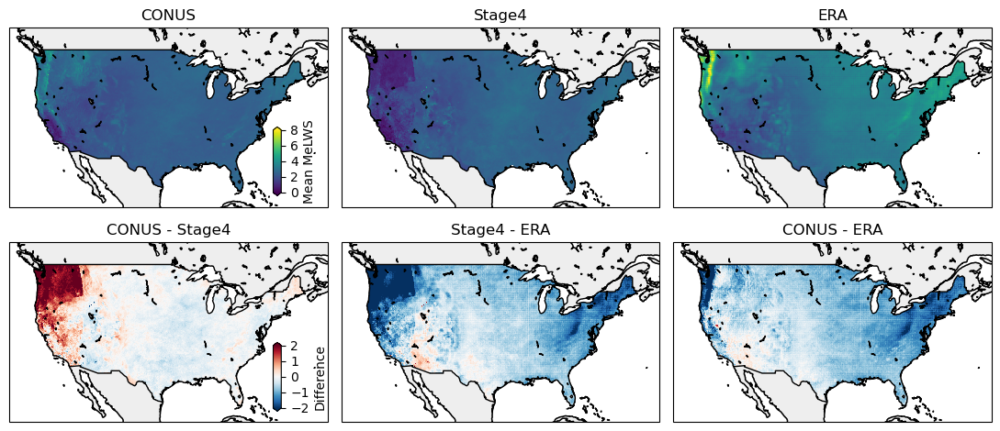

In [5]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['MeLWS'].mean(dim='year')
data_sta = ds_sta_2002_2022['MeLWS'].mean(dim='year')
data_era = ds_era_2002_2022['MeLWS'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=8, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -62, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=2, vmin=-2)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -62, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.275, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='both')
cbar1.set_ticks([0, 2, 4, 6, 8])
cbar1.set_label('Mean MeLWS')

cbar_ax1 = fig.add_axes([0.275, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-2, -1, 0, 1, 2])
cbar2.set_label('Difference')

plt.tight_layout()
plt.show()


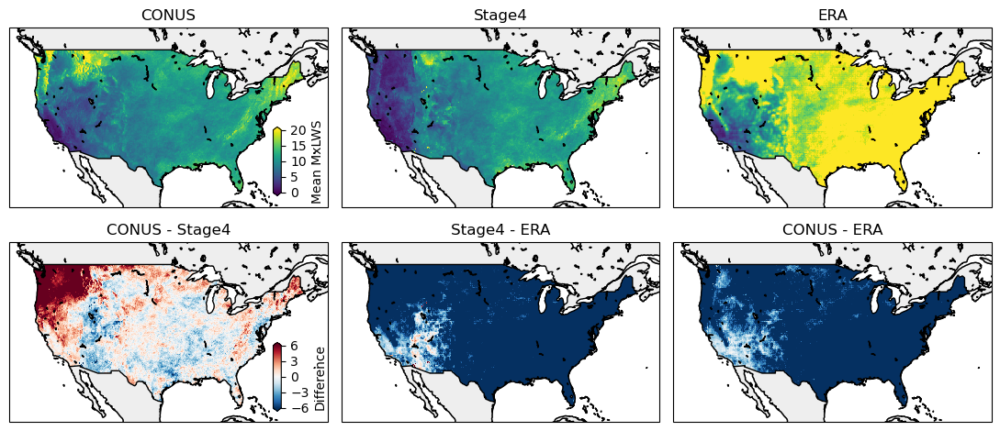

In [6]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['MxLWS'].mean(dim='year')
data_sta = ds_sta_2002_2022['MxLWS'].mean(dim='year')
data_era = ds_era_2002_2022['MxLWS'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=20, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -62, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=6, vmin=-6)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -62, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.275, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='both')
cbar1.set_ticks([0, 5, 10, 15, 20])
cbar1.set_label('Mean MxLWS')

cbar_ax1 = fig.add_axes([0.275, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-6, -3, 0, 3, 6])
cbar2.set_label('Difference')

plt.tight_layout()
plt.show()

## annual maxima of H-hour (1-, 3-, 6-, 12- or 24-hour) precipitation series

In [7]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_RxHhr_1_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_RxHhr_1_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_RxHhr_1_U*')

In [8]:
ds_con_2002_2022 = ds_con.sel(time=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(time=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(time=slice(2002, 2022))

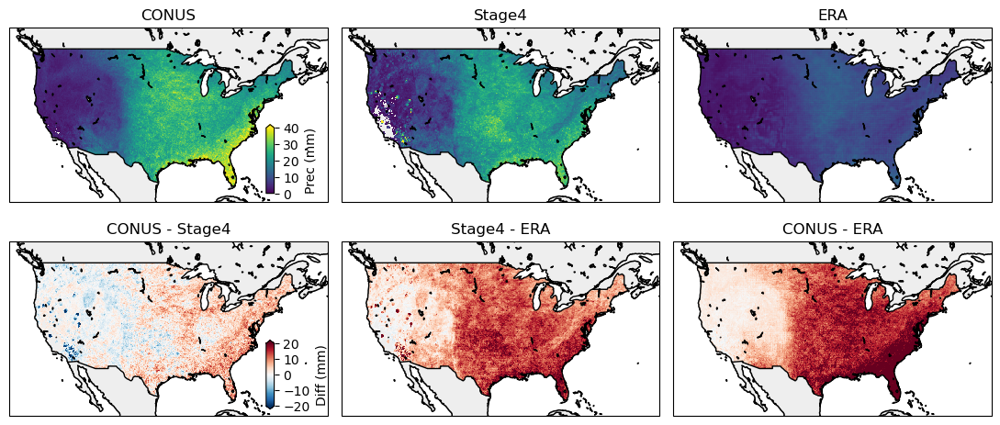

In [9]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['p'].mean(dim='time')
data_sta = ds_sta_2002_2022['p'].mean(dim='time')
data_era = ds_era_2002_2022['p'].mean(dim='time')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=40, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=20, vmin=-20)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0, 10, 20, 30, 40,])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-20, -10, 0, 10, 20])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

In [10]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_RxHhr_3_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_RxHhr_3_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_RxHhr_3_U*')

ds_con_2002_2022 = ds_con.sel(time=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(time=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(time=slice(2002, 2022))

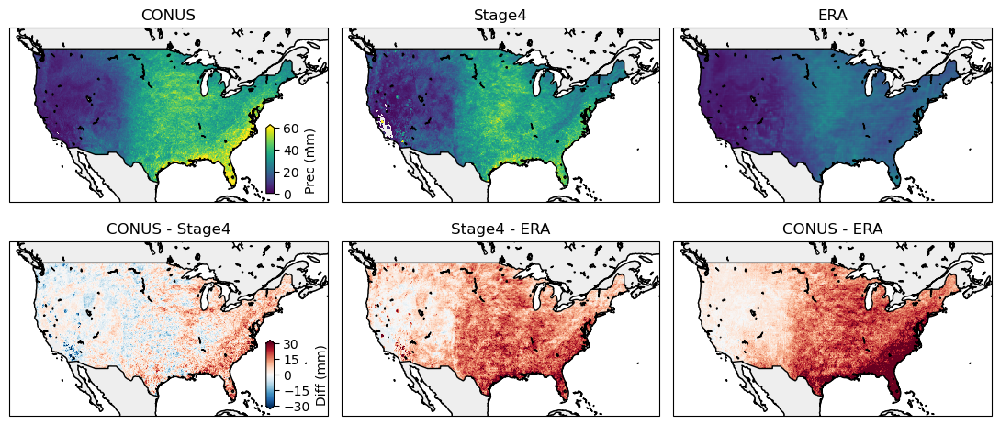

In [11]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['p'].mean(dim='time')
data_sta = ds_sta_2002_2022['p'].mean(dim='time')
data_era = ds_era_2002_2022['p'].mean(dim='time')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=60, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=30, vmin=-30)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0,  20, 40,  60])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-30, -15, 0, 15, 30])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

In [12]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_RxHhr_6_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_RxHhr_6_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_RxHhr_6_U*')

ds_con_2002_2022 = ds_con.sel(time=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(time=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(time=slice(2002, 2022))

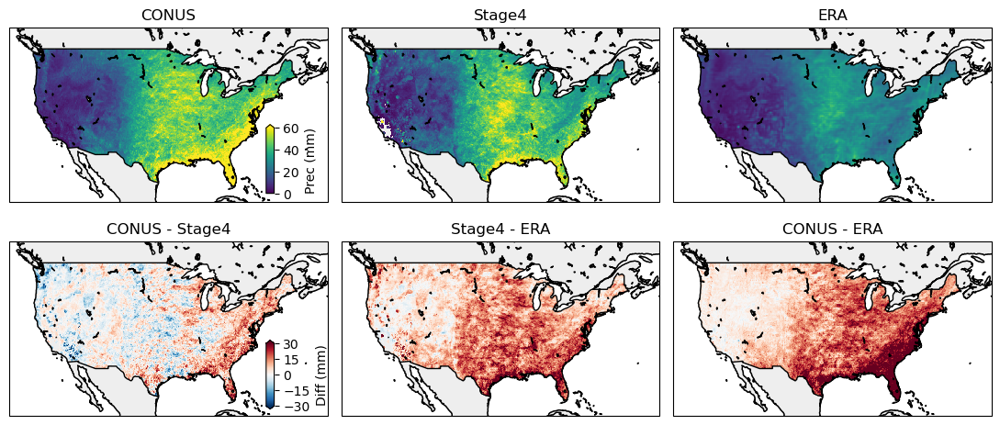

In [13]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['p'].mean(dim='time')
data_sta = ds_sta_2002_2022['p'].mean(dim='time')
data_era = ds_era_2002_2022['p'].mean(dim='time')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=60, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=30, vmin=-30)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0,  20, 40,  60])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-30, -15, 0, 15, 30])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

In [14]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_RxHhr_12_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_RxHhr_12_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_RxHhr_12_U*')

ds_con_2002_2022 = ds_con.sel(time=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(time=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(time=slice(2002, 2022))

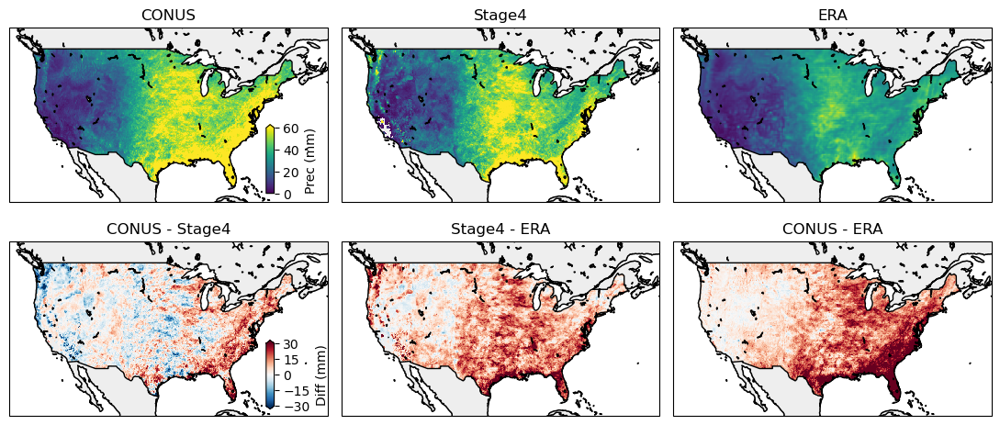

In [15]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['p'].mean(dim='time')
data_sta = ds_sta_2002_2022['p'].mean(dim='time')
data_era = ds_era_2002_2022['p'].mean(dim='time')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=60, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=30, vmin=-30)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0,  20, 40,  60])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-30, -15, 0, 15, 30])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

In [16]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_RxHhr_24_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_RxHhr_24_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_RxHhr_24_U*')

ds_con_2002_2022 = ds_con.sel(time=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(time=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(time=slice(2002, 2022))

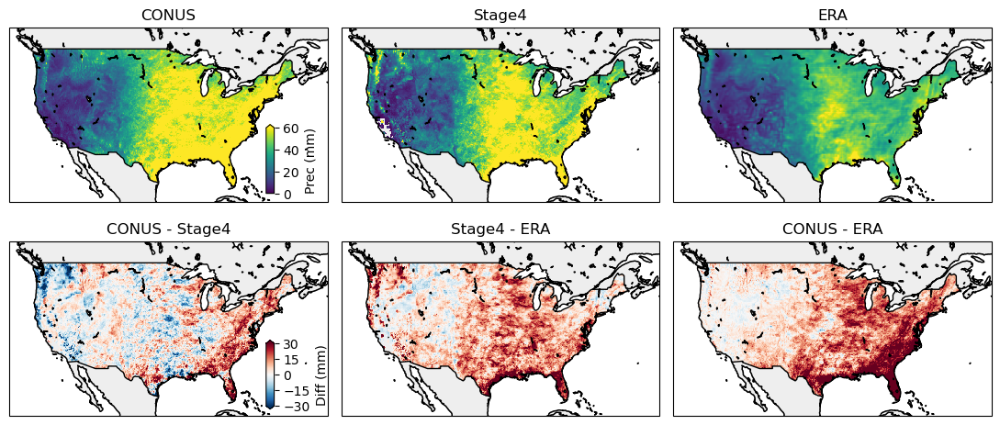

In [17]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['p'].mean(dim='time')
data_sta = ds_sta_2002_2022['p'].mean(dim='time')
data_era = ds_era_2002_2022['p'].mean(dim='time')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=60, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=30, vmin=-30)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0,  20, 40,  60])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-30, -15, 0, 15, 30])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

## Percentage contribution of Rx1hr (1-hour maximum) to the total precipitation of the corresponding calendar day (00:00-00:00 local time)

In [18]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_Rx1hrP_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_Rx1hrP_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_Rx1hrP_U*')

ds_con_2002_2022 = ds_con.sel(year=slice(2002, 2022)).mean('day')
ds_sta_2002_2022 = ds_sta.sel(year=slice(2002, 2022)).mean('day')
ds_era_2002_2022 = ds_era.sel(year=slice(2002, 2022)).mean('day')

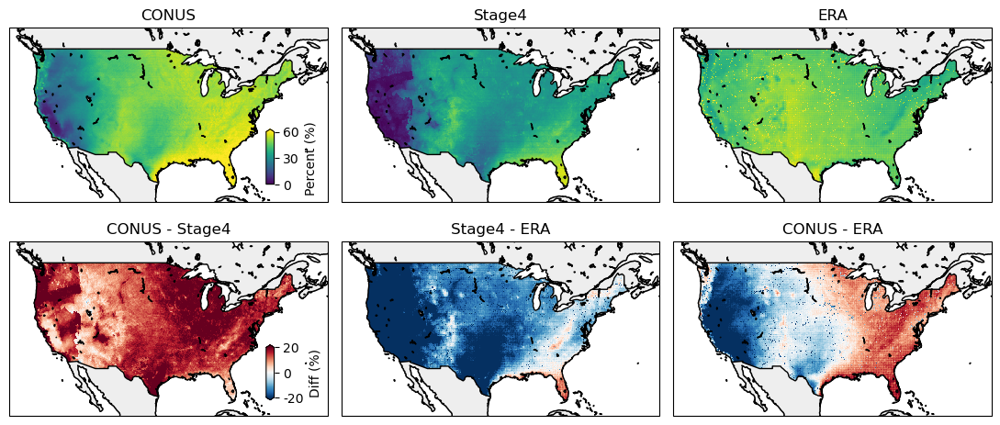

In [19]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['percent'].mean(dim='year')
data_sta = ds_sta_2002_2022['percent'].mean(dim='year')
data_era = ds_era_2002_2022['percent'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=0.6, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=0.2, vmin=-0.2)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.58, 0.008, 0.12])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0, 0.3, 0.6])
cbar1.set_ticklabels(['0', '30', '60'])
cbar1.set_label('Percent (%)')

cbar_ax1 = fig.add_axes([0.268, 0.11, 0.008, 0.12])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-0.2, 0, 0.2])
cbar2.set_ticklabels(['-20', '0', '20'])
cbar2.set_label('Diff (%)')

plt.tight_layout()
plt.show()

## Count of hours (or multi-hour intervals if H is greater than 1) greater than 10, 20, 30 or 50 mm thresholds (T)

In [20]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_RHhrTmm_1_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_RHhrTmm_1_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_RHhrTmm_1_U*')

ds_con_2002_2022 = ds_con.sel(year=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(year=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(year=slice(2002, 2022))

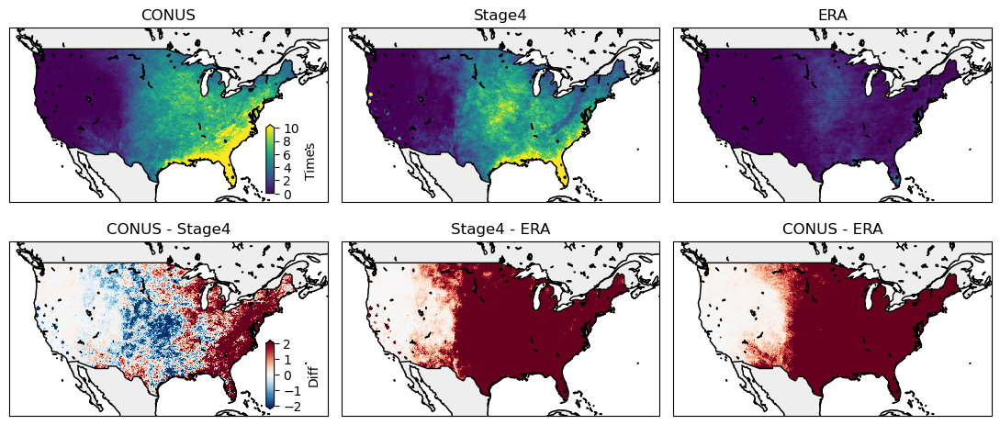

In [21]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['c_10'].mean(dim='year')
data_sta = ds_sta_2002_2022['c_10'].mean(dim='year')
data_era = ds_era_2002_2022['c_10'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=10, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=2, vmin=-2)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0, 2,4,6,8,10])
cbar1.set_label('Times')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-2, -1, 0, 1, 2])
cbar2.set_label('Diff')

plt.tight_layout()
plt.show()

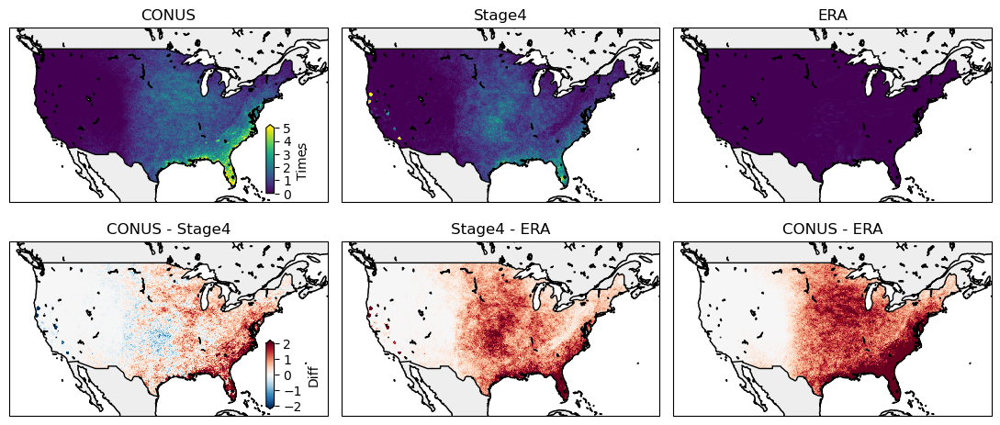

In [22]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['c_20'].mean(dim='year')
data_sta = ds_sta_2002_2022['c_20'].mean(dim='year')
data_era = ds_era_2002_2022['c_20'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=5, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=2, vmin=-2)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0, 1,2,3,4,5])
cbar1.set_label('Times')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-2, -1, 0, 1, 2])
cbar2.set_label('Diff')

plt.tight_layout()
plt.show()

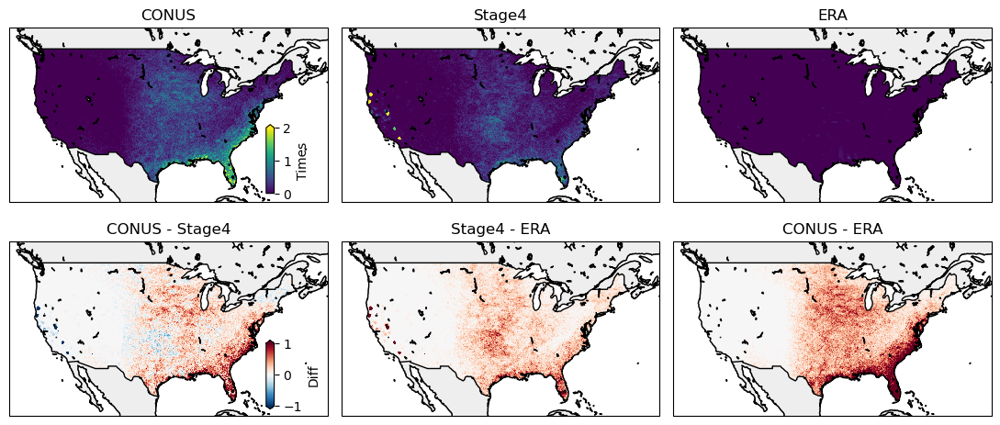

In [23]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['c_30'].mean(dim='year')
data_sta = ds_sta_2002_2022['c_30'].mean(dim='year')
data_era = ds_era_2002_2022['c_30'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=2, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=1, vmin=-1)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0, 1,2])
cbar1.set_label('Times')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-1, 0, 1,])
cbar2.set_label('Diff')

plt.tight_layout()
plt.show()

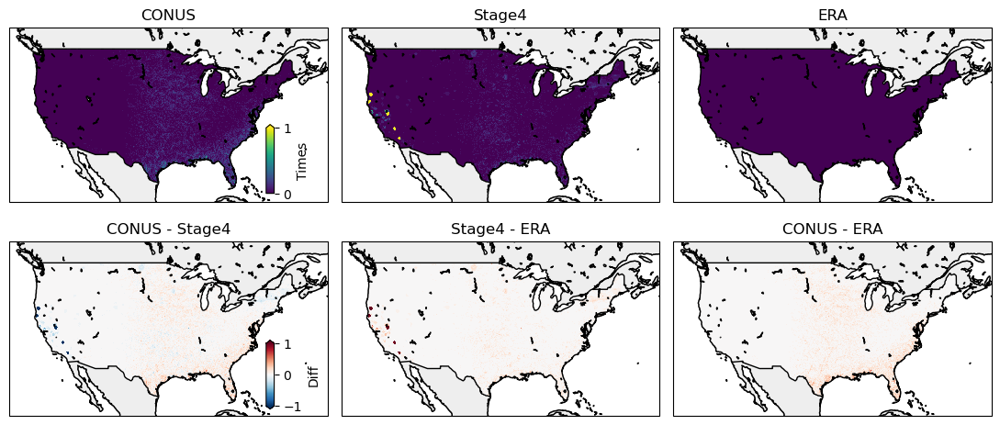

In [24]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['c_50'].mean(dim='year')
data_sta = ds_sta_2002_2022['c_50'].mean(dim='year')
data_era = ds_era_2002_2022['c_50'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=1, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=1, vmin=-1)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0, 1])
cbar1.set_label('Times')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-1, 0, 1,])
cbar2.set_label('Diff')

plt.tight_layout()
plt.show()

## Percentage contribution to monthly, seasonal or annual totals from H-hour intervals exceeding the Qth (95th or 99th) wet-hour (w) percentiles (see RQpwHhr in Table 2)

In [25]:
ds_con_2002_2022 = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_quantile_U*')
ds_sta_2002_2022 = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_quantile_U*')
ds_era_2002_2022 = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_quantile_U*')

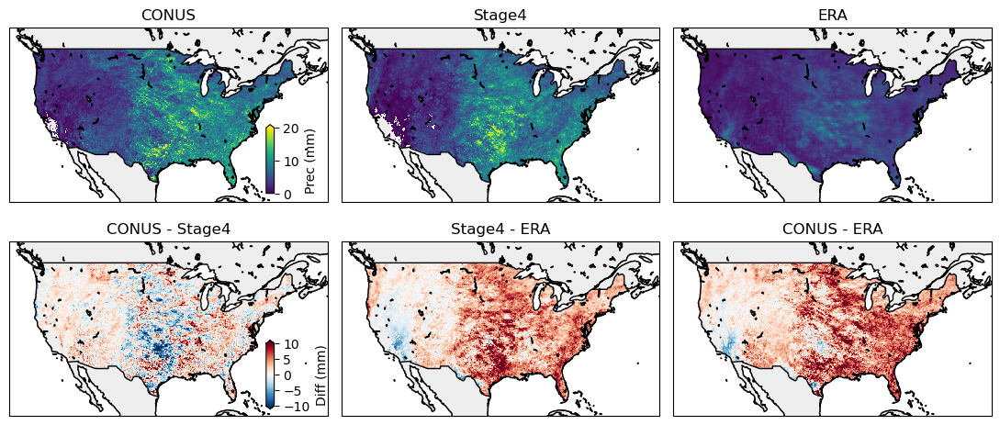

In [26]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['q_95']
data_sta = ds_sta_2002_2022['q_95']
data_era = ds_era_2002_2022['q_95']

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=20, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=10, vmin=-10)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0, 10, 20,])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([ -10, -5, 0, 5,10])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

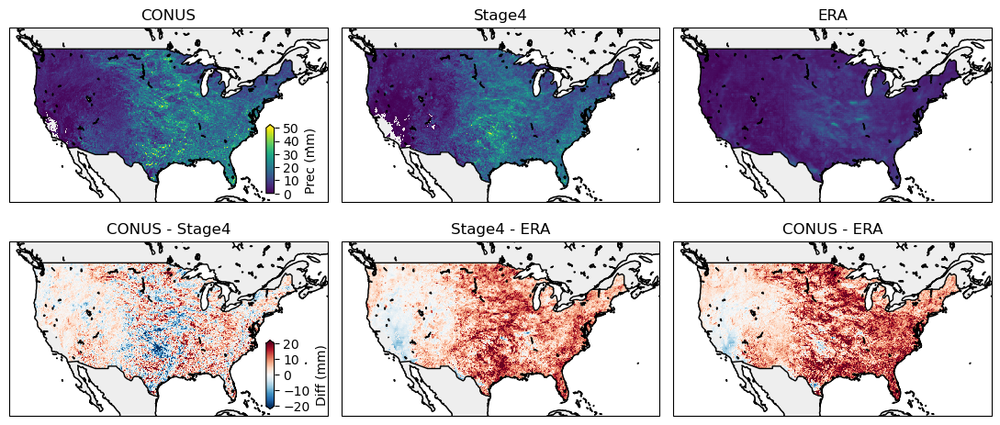

In [27]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['q_99']
data_sta = ds_sta_2002_2022['q_99']
data_era = ds_era_2002_2022['q_99']

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=50, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=20, vmin=-20)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0, 10, 20, 30, 40, 50,])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([ -20, -10, 0, 10, 20])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

In [28]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_percent_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_percent_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_percent_U*')

ds_con_2002_2022 = ds_con.sel(year=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(year=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(year=slice(2002, 2022))

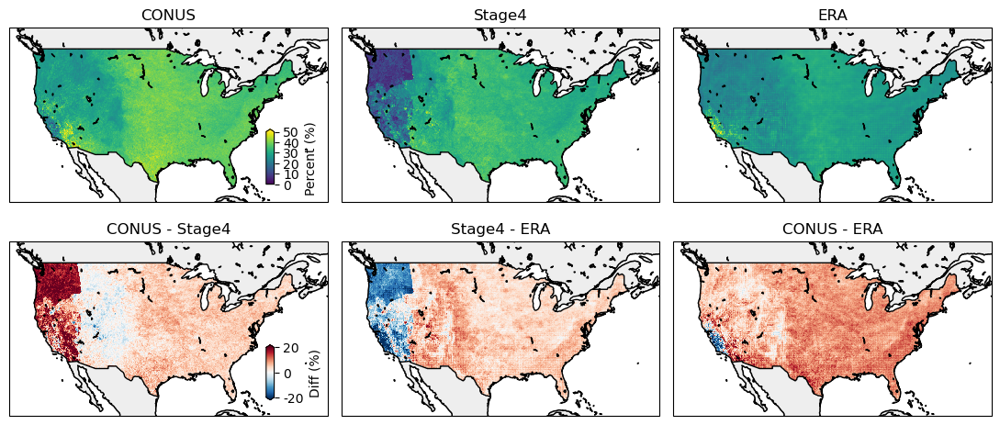

In [29]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['percent_95'].mean(dim='year')
data_sta = ds_sta_2002_2022['percent_95'].mean(dim='year')
data_era = ds_era_2002_2022['percent_95'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=0.5, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=0.2, vmin=-0.2)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.58, 0.008, 0.12])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0, 0.1, 0.2, 0.3, 0.4, 0.5])
cbar1.set_ticklabels(['0', '10', '20', '30', '40', '50',])
cbar1.set_label('Percent (%)')

cbar_ax1 = fig.add_axes([0.268, 0.11, 0.008, 0.12])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-0.2, 0, 0.2])
cbar2.set_ticklabels(['-20', '0', '20'])
cbar2.set_label('Diff (%)')

plt.tight_layout()
plt.show()

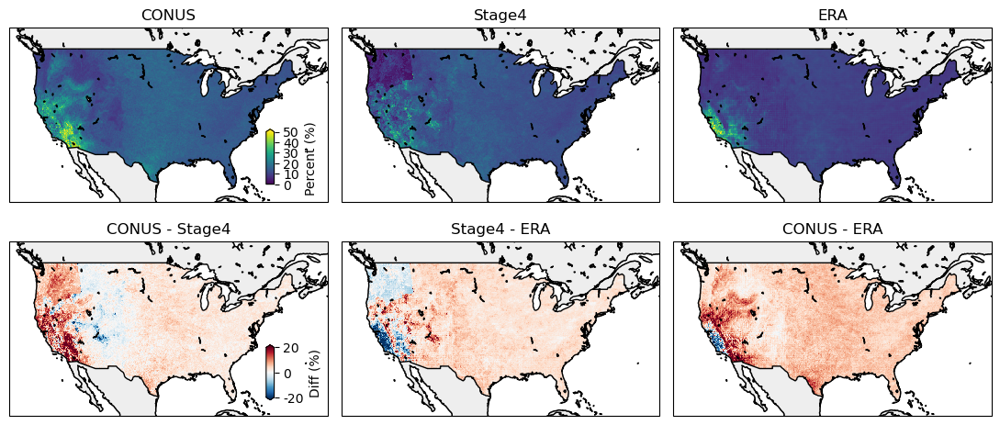

In [30]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['percent_99'].mean(dim='year')
data_sta = ds_sta_2002_2022['percent_99'].mean(dim='year')
data_era = ds_era_2002_2022['percent_99'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=0.5, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=0.2, vmin=-0.2)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.58, 0.008, 0.12])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0, 0.1, 0.2, 0.3, 0.4, 0.5])
cbar1.set_ticklabels(['0', '10', '20', '30', '40', '50',])
cbar1.set_label('Percent (%)')

cbar_ax1 = fig.add_axes([0.268, 0.11, 0.008, 0.12])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-0.2, 0, 0.2])
cbar2.set_ticklabels(['-20', '0', '20'])
cbar2.set_label('Diff (%)')

plt.tight_layout()
plt.show()

## Total number of wet hours

In [31]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_NWH_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_NWH_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_NWH_U*')

ds_con_2002_2022 = ds_con.sel(year=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(year=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(year=slice(2002, 2022))

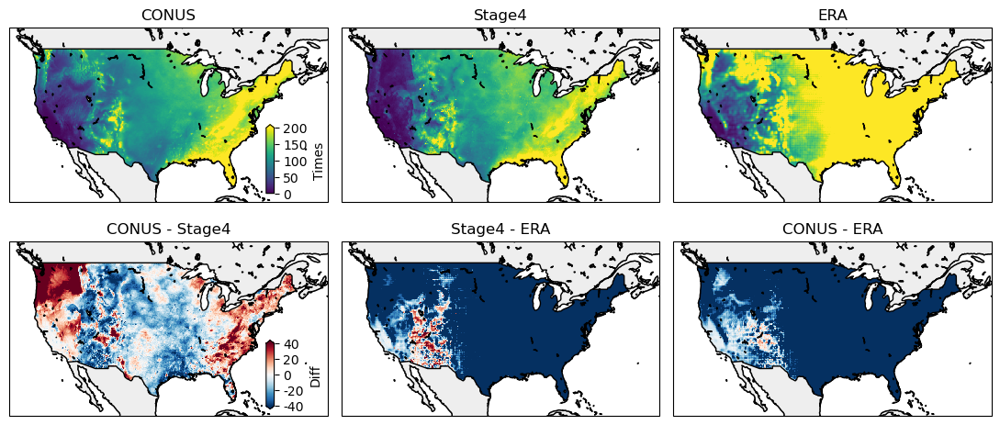

In [32]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['c'].mean(dim='year')
data_sta = ds_sta_2002_2022['c'].mean(dim='year')
data_era = ds_era_2002_2022['c'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=200, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=40, vmin=-40)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0,50,100,150, 200])
cbar1.set_label('Times')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-40,-20, 0, 20, 40,])
cbar2.set_ticklabels(['-40','-20', '0', '20','40'])
cbar2.set_label('Diff')

plt.tight_layout()
plt.show()

## Simple precipitation intensity index, defined as mean precipitation in wet hours (or multi-hour intervals if H is greater than 1)

In [33]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_SPIIHhr_1_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_SPIIHhr_1_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_SPIIHhr_1_U*')

ds_con_2002_2022 = ds_con.sel(year=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(year=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(year=slice(2002, 2022))

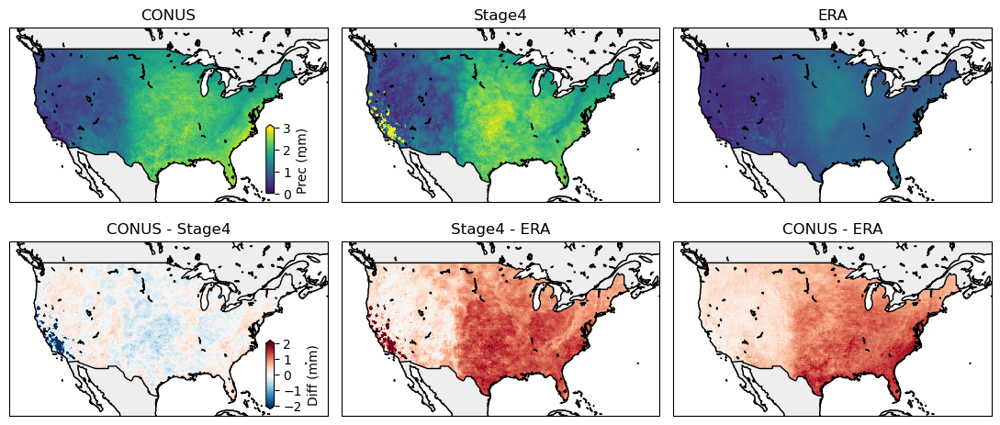

In [34]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['p'].mean(dim='year')
data_sta = ds_sta_2002_2022['p'].mean(dim='year')
data_era = ds_era_2002_2022['p'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=3, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=2, vmin=-2)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0,1,2,3])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-2,-1, 0, 1,2])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

In [35]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_SPIIHhr_3_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_SPIIHhr_3_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_SPIIHhr_3_U*')

ds_con_2002_2022 = ds_con.sel(year=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(year=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(year=slice(2002, 2022))

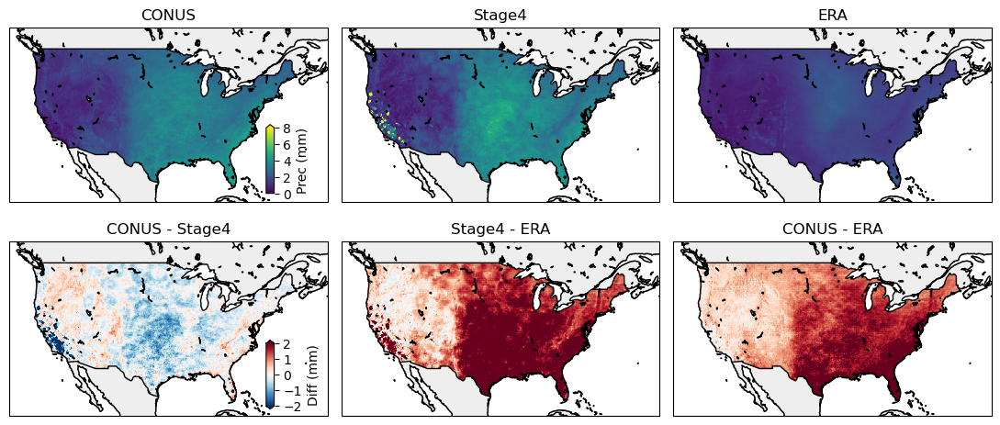

In [36]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['p'].mean(dim='year')
data_sta = ds_sta_2002_2022['p'].mean(dim='year')
data_era = ds_era_2002_2022['p'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=8, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=2, vmin=-2)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0,2,4,6,8])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-2,-1, 0, 1,2])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

In [37]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_SPIIHhr_6_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_SPIIHhr_6_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_SPIIHhr_6_U*')

ds_con_2002_2022 = ds_con.sel(year=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(year=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(year=slice(2002, 2022))

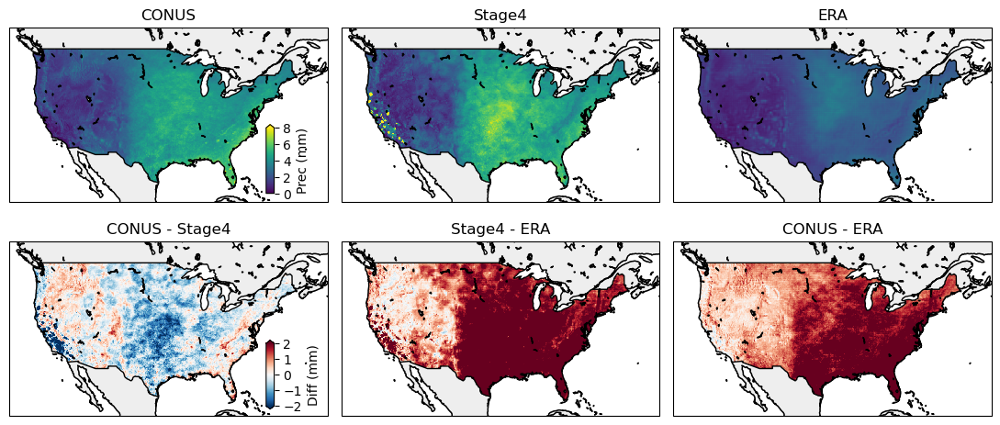

In [38]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['p'].mean(dim='year')
data_sta = ds_sta_2002_2022['p'].mean(dim='year')
data_era = ds_era_2002_2022['p'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=8, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=2, vmin=-2)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0,2,4,6,8])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-2,-1, 0, 1,2])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

In [39]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_SPIIHhr_12_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_SPIIHhr_12_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_SPIIHhr_12_U*')

ds_con_2002_2022 = ds_con.sel(year=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(year=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(year=slice(2002, 2022))

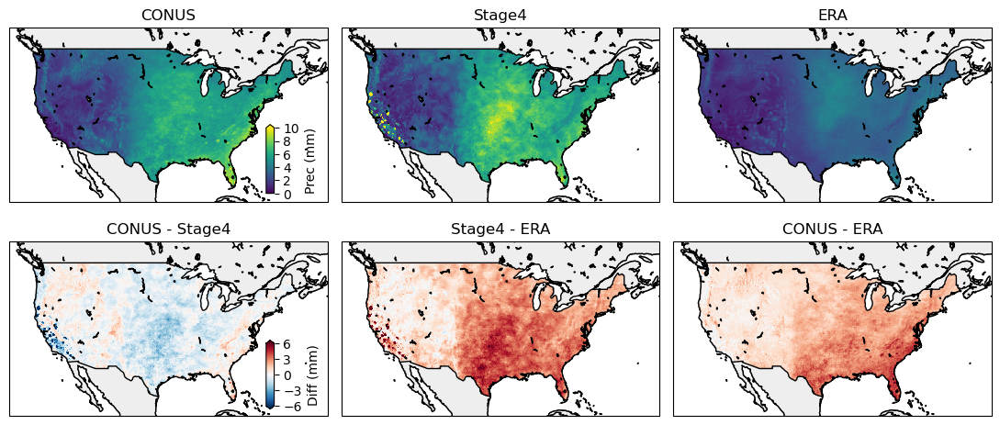

In [40]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['p'].mean(dim='year')
data_sta = ds_sta_2002_2022['p'].mean(dim='year')
data_era = ds_era_2002_2022['p'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=10, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=6, vmin=-6)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0,2,4,6,8,10])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-6,-3, 0, 3,6])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

In [41]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_SPIIHhr_24_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_SPIIHhr_24_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_SPIIHhr_24_U*')

ds_con_2002_2022 = ds_con.sel(year=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(year=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(year=slice(2002, 2022))

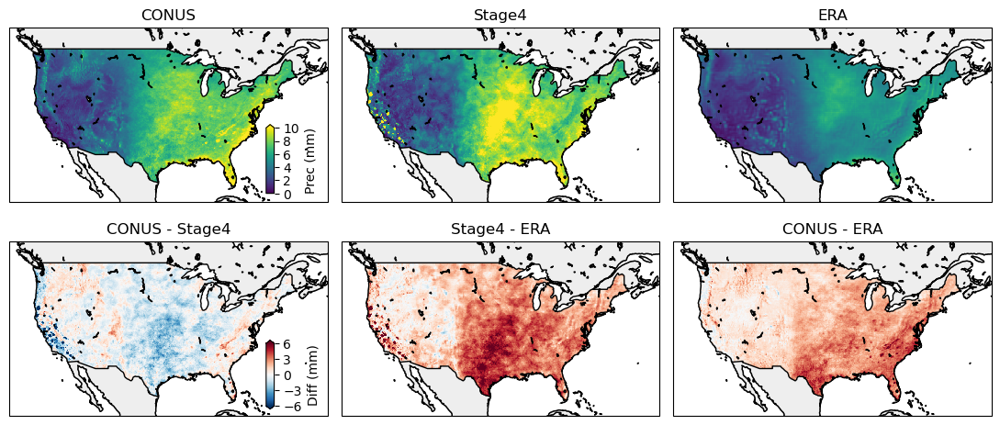

In [42]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['p'].mean(dim='year')
data_sta = ds_sta_2002_2022['p'].mean(dim='year')
data_era = ds_era_2002_2022['p'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=10, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=6, vmin=-6)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0,2,4,6,8,10])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-6,-3, 0, 3,6])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()

## Total precipitation

In [43]:
ds_con = xr.open_mfdataset('/N/project/Zli_lab/gongg/CONUS404_data/prec_index/ds_RTot_U*')
ds_sta = xr.open_mfdataset('/N/project/Zli_lab/gongg/stage4_data/prec_index/ds_RTot_U*')
ds_era = xr.open_mfdataset('/N/project/Zli_lab/gongg/ERA_data/prec_index/ds_RTot_U*')

ds_con_2002_2022 = ds_con.sel(year=slice(2002, 2022))
ds_sta_2002_2022 = ds_sta.sel(year=slice(2002, 2022))
ds_era_2002_2022 = ds_era.sel(year=slice(2002, 2022))

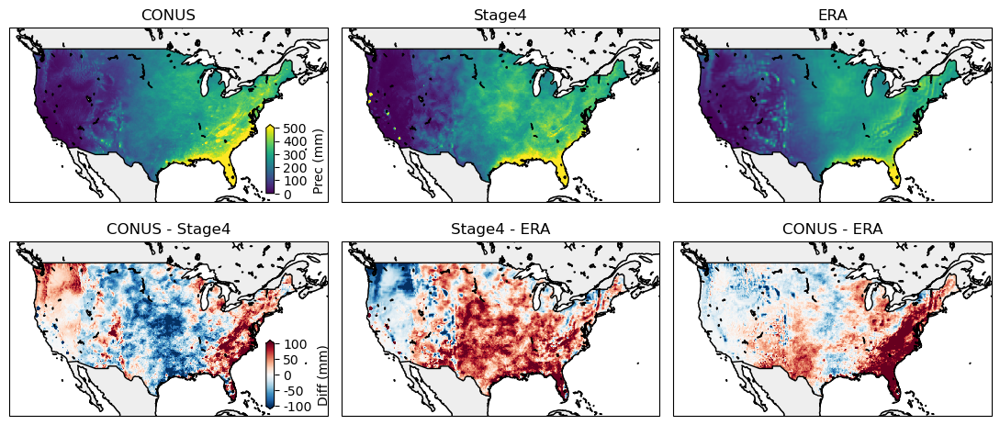

In [44]:

ds_con_2002_2022 = ds_con_2002_2022.sortby('lat')
ds_sta_2002_2022 = ds_sta_2002_2022.sortby('lat')
ds_era_2002_2022 = ds_era_2002_2022.sortby('lat')

data_con = ds_con_2002_2022['p'].mean(dim='year')
data_sta = ds_sta_2002_2022['p'].mean(dim='year')
data_era = ds_era_2002_2022['p'].mean(dim='year')

fig, axes = plt.subplots(2, 3, dpi=dpi_, figsize=(11, 5), subplot_kw={'projection': ccrs.Mercator()})

titles_first = ['CONUS', 'Stage4', 'ERA']
datasets_first = [data_con, data_sta, data_era]
data_vars = [ds_con_2002_2022, ds_sta_2002_2022, ds_era_2002_2022]

for i, ax in enumerate(axes[0, :]):
    ds_temp = data_vars[i]
    im = ax.pcolormesh(ds_temp['lon'], ds_temp['lat'], datasets_first[i],
                       transform=ccrs.PlateCarree(), vmax=500, vmin=0,
                       cmap='viridis')
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_first[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

titles_second = ['CONUS - Stage4', 'Stage4 - ERA', 'CONUS - ERA']
diff1 = data_con - data_sta
diff2 = data_sta - data_era
diff3 = data_con - data_era
datasets_second = [diff1, diff2, diff3]

for i, ax in enumerate(axes[1, :]):
    im_diff = ax.pcolormesh(ds_con_2002_2022['lon'], ds_con_2002_2022['lat'], datasets_second[i],
                            transform=ccrs.PlateCarree(),
                            cmap='RdBu_r', vmax=100, vmin=-100)
    ax.coastlines()
    ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='#dedede', alpha=0.5)
    ax.add_feature(cfeature.BORDERS, linestyle='-')
    ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='w')
    ax.set_title(titles_second[i])
    ax.set_extent([-130, -60, 22, 52], crs=ccrs.PlateCarree())

cbar_ax0 = fig.add_axes([0.268, 0.56, 0.008, 0.15])
cbar1 = fig.colorbar(im, cax=cbar_ax0, orientation='vertical', extend='max')
cbar1.set_ticks([0,100,200,300,400,500,])
cbar1.set_label('Prec (mm)')

cbar_ax1 = fig.add_axes([0.268, 0.09, 0.008, 0.15])
cbar2 = fig.colorbar(im_diff, cax=cbar_ax1, orientation='vertical', extend='both')
cbar2.set_ticks([-100,-50, 0, 50, 100])
cbar2.set_ticklabels(['-100','-50', '0', '50','100'])
cbar2.set_label('Diff (mm)')

plt.tight_layout()
plt.show()